In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import random
from model import load_data, get_analytics
from cytoself_custom import plot_umap, calc_umap_embvec, plot_feature_spectrum_from_image, arrange_plots
from synthetic_multiplexing import multiplex
from metrics import plot_boostrapping, calc_bootstrapping, plot_metrics, calc_reconstruction_error
from explainability import generate_images, plot_clusters_distance_heatmap
from utils import get_colors_dict
from sklearn.metrics.pairwise import euclidean_distances
import seaborn as sns

import os
import config
from config import SEED, PRETRAINED_MODEL_PATH, MODEL_FOLDER, METRICS_FOLDER, METRICS_MATCH_PATH, METRICS_RANDOM_PATH, MICROGLIA_MARKERS

np.random.seed(SEED)
random.seed(SEED)

%reload_ext autoreload
%autoreload 2
%aimport

In /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was dep

Modules to reload:
all-except-skipped

Modules to skip:



In [2]:
import logging
# log_file_path = f"./logs/figures_V3_log.log"
# logging.basicConfig(level=logging.INFO,
#                     format="%(asctime)s %(levelname)s %(message)s",
#                     datefmt="%Y-%m-%d %H:%M:%S",
#                     handlers=[
#         logging.FileHandler(log_file_path),
#         logging.StreamHandler()
#     ])

logging.info("init")

2022-12-26 18:22:11 INFO init


In [3]:
MODEL_PATH = os.path.join(MODEL_FOLDER, "microglia_model.h5")

In [4]:
logging.info(f"init")

input_folders =[ "./data/processed/microglia"]
cytoself_model_path = PRETRAINED_MODEL_PATH
imgself_model_path = MODEL_PATH

logging.info(f"Loading data")
images, labels, labels_changepoints, markers_order = load_data(input_folders, condition_l=True, type_l=False,
                                                               cell_lines_include=["WT"], 
                                                               split_by_set=True,
                                                               set_type="test",
                                                               markers=MICROGLIA_MARKERS,
                                                               split_by_set_include=[("WT", "unstressed")])

2022-12-26 18:22:12 INFO init
2022-12-26 18:22:12 INFO Loading data


#########################################################
########### Splitting by set! (test) #############
#########################################################
Input folder: ./data/processed/microglia
Input subfolder: ANXA11
Filepath: ./data/processed/microglia/WT/unstressed/ANXA11/221002_iNDI_MG_WT_unstressed-SCNA_ANXA11_DAPI_WT.tif_processed
Input subfolder: CD41
Filepath: ./data/processed/microglia/WT/unstressed/CD41/220929_iNDI_MG_WT_unstressed-SQSTM1_FMRP_CD41_DAPI_WT.tif_processed
Input subfolder: CLTC
Filepath: ./data/processed/microglia/WT/unstressed/CLTC/220930_iNDI_MG_WT_unstressed-PSD95_CLTC_phalloidin_DAPI_WT.tif_processed
Input subfolder: Calreticulin
Filepath: ./data/processed/microglia/WT/unstressed/Calreticulin/221003_iNDI_MG_WT_unstressed-LAMP1_Calreticulin_DAPI_WT.tif_processed
Input subfolder: DAPI
Filepath: ./data/processed/microglia/WT/unstressed/DAPI/2200908_iNDI_MG_WT_unstressed-G3BP1_KIF5A_TIA1_DAPI_WT.tif_processed
Filepath: ./data/processed/microglia/WT

In [5]:
# n_images = 5
# logging.info(f"init")

# labels_s = pd.Series(labels.reshape(-1,))

# for m in MICROGLIA_MARKERS:
#     logging.info(f"[{m}] Marker: {m}")
#     markers_regex = '|'.join(list(map(lambda x: f"^{x}$|^{x}_", [m])))
#     markers_indexes = labels_s[labels_s.str.contains(markers_regex)].index
#     markers_indexes_subset = np.random.choice(markers_indexes,
#                                               size=min(n_images, len(markers_indexes)),
#                                               replace=False)
#     images_subset = images[markers_indexes_subset]
#     labels_subset = labels[markers_indexes_subset]  

#     # Load models
# #     logging.info(f"[{m}] get analytics_cytoself")
# #     analytics_cytoself = get_analytics(images_subset, labels_subset, model_path=cytoself_model_path)
#     logging.info(f"[{m}] get analytics_neuroself")
#     analytics_imgself = get_analytics(images_subset, labels_subset, model_path=imgself_model_path)

#     # Generate reconsturcted images and calculate reconstruction error (MSE)
# #     logging.info(f"[{m}] Generate reconstructed images (cytoself)")
# #     calc_reconstruction_error(analytics_cytoself, show=True,to_norm=False)

#     logging.info(f"[{m}] Generate reconstructed images (imgself)")
#     calc_reconstruction_error(analytics_imgself, show=True,to_norm=False)

2022-12-26 18:22:14 INFO init
2022-12-26 18:22:14 INFO [KIF5A] Marker: KIF5A
2022-12-26 18:22:14 INFO [KIF5A] get analytics_neuroself


X, y:
(5, 100, 100, 2) (5,)
KIF5A_unstressed    5
dtype: int64
Creating the model
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


2022-12-26 18:22:14 WARNING From /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/tensorflow_core/python/ops/resource_variable_ops.py:1630: calling BaseResourceVariable.__init__ (from tensorflow.python.ops.resource_variable_ops) with constraint is deprecated and will be removed in a future version.
Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


2022-12-26 18:22:21 WARNING From /home/labs/hornsteinlab/noamru/anaconda3/envs/cytoself4/lib/python3.7/site-packages/tensorflow_core/python/keras/initializers.py:119: calling RandomUniform.__init__ (from tensorflow.python.ops.init_ops) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor




All files will be saved at model_outputs/


Loading weights


2022-12-26 18:22:24 WARNING OMP_NUM_THREADS is no longer used by the default Keras config. To configure the number of threads, use tf.config.threading APIs.
2022-12-26 18:22:24.250601: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2022-12-26 18:22:24.272073: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:22:24.273981: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:22:24.284534: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:22:24.292192: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:22:24.297381: I tensorflow/stream_executor/

./models/microglia_model.h5
is loaded.
Ground truth:
['KIF5A_unstressed']
Inferring embedding vectors...


2022-12-26 18:22:31.964059: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:22:32.191711: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudnn.so.7
2022-12-26 18:22:33.739982: W tensorflow/stream_executor/cuda/redzone_allocator.cc:312] Not found: ./bin/ptxas not found
Relying on driver to perform ptx compilation. This message will be only logged once.


5/5 [==============================] - 3s 692ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


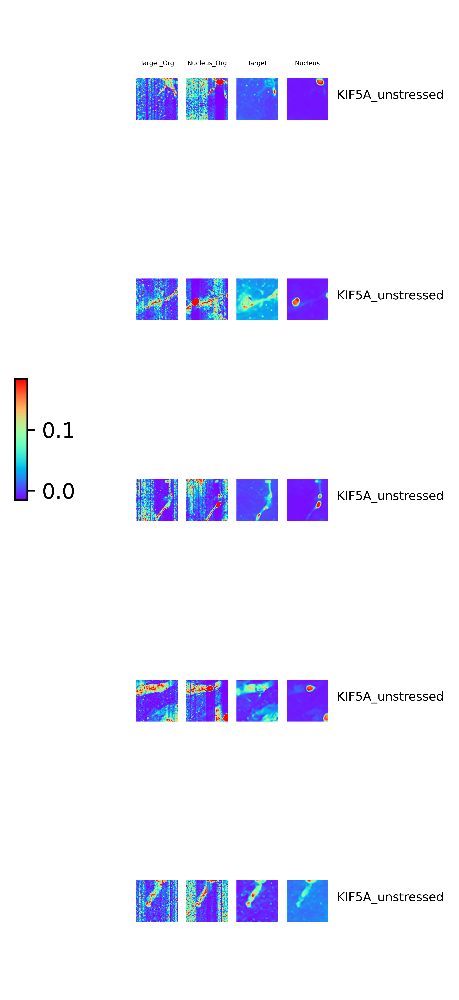

2022-12-26 18:22:38 WARNING From /home/labs/hornsteinlab/Collaboration/MOmaps/metrics.py:144: The name tf.Session is deprecated. Please use tf.compat.v1.Session instead.

2022-12-26 18:22:38.209987: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:22:38.210084: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:22:38.210101: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:22:38.210115: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:22:38.210128: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:22:38.210141: I tensorfl

X, y:
(5, 100, 100, 2) (5,)
FUS_unstressed    5
dtype: int64
Creating the model


All files will be saved at model_outputs/


Loading weights


2022-12-26 18:22:56 INFO [FUS] Generate reconstructed images (imgself)


./models/microglia_model.h5
is loaded.
Ground truth:
['FUS_unstressed']
Inferring embedding vectors...
5/5 [==============================] - 2s 462ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


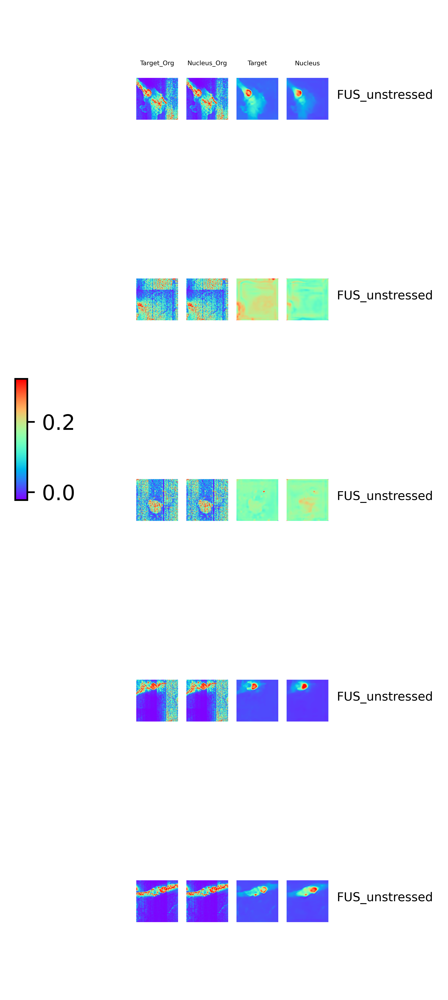

2022-12-26 18:23:03.297624: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:23:03.297718: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:23:03.297732: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:23:03.297744: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:23:03.297756: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:23:03.297768: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-12-26 18:23:03.297780: I tensorflow/stream_executor/plat

X, y:
(5, 100, 100, 2) (5,)
SCNA_unstressed    5
dtype: int64
Creating the model


All files will be saved at model_outputs/


Loading weights


2022-12-26 18:23:22 INFO [SCNA] Generate reconstructed images (imgself)


./models/microglia_model.h5
is loaded.
Ground truth:
['SCNA_unstressed']
Inferring embedding vectors...
5/5 [==============================] - 2s 438ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


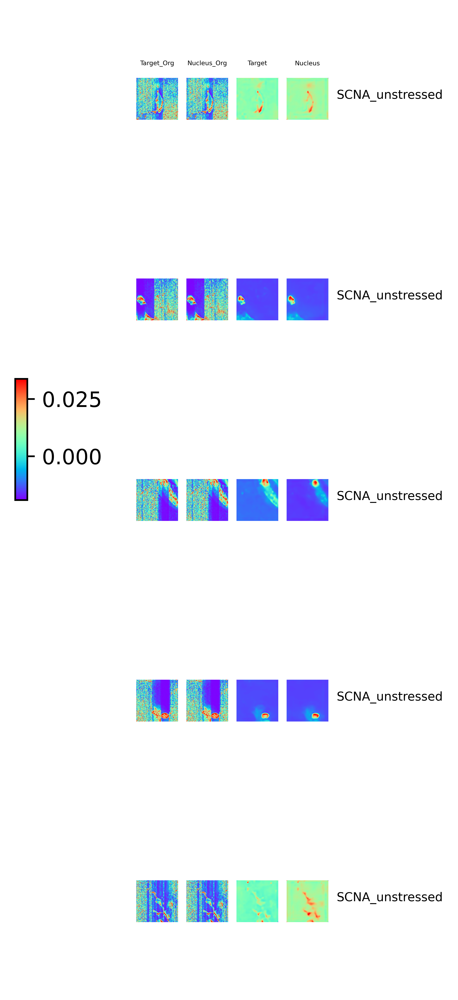

2022-12-26 18:23:28.762114: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:23:28.762235: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:23:28.762260: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:23:28.762279: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:23:28.762294: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:23:28.762306: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-12-26 18:23:28.762316: I tensorflow/stream_executor/plat

X, y:
(5, 100, 100, 2) (5,)
PSD95_unstressed    5
dtype: int64
Creating the model


All files will be saved at model_outputs/


Loading weights


2022-12-26 18:23:52 INFO [PSD95] Generate reconstructed images (imgself)


./models/microglia_model.h5
is loaded.
Ground truth:
['PSD95_unstressed']
Inferring embedding vectors...
5/5 [==============================] - 3s 699ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


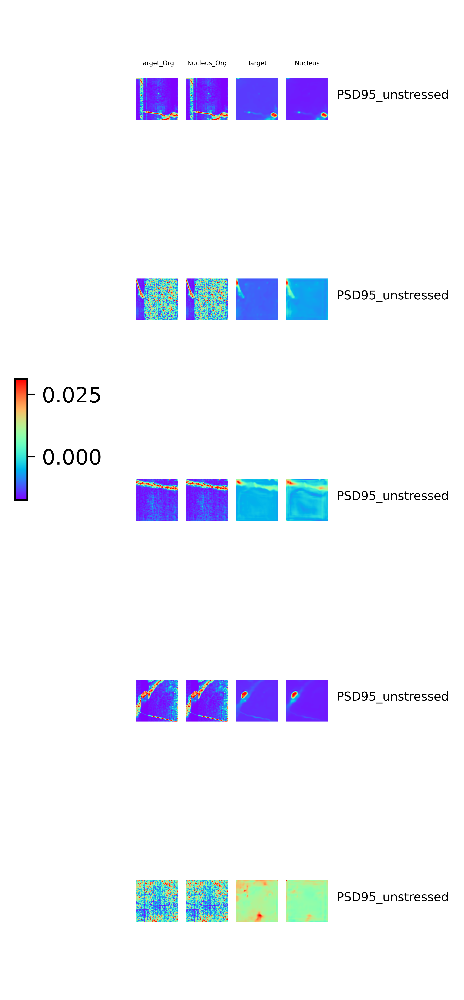

2022-12-26 18:24:01.975351: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:24:01.975458: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:24:01.975476: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:24:01.975486: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:24:01.975500: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:24:01.975511: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-12-26 18:24:01.975521: I tensorflow/stream_executor/plat

X, y:
(5, 100, 100, 2) (5,)
GM130_unstressed    5
dtype: int64
Creating the model


All files will be saved at model_outputs/


Loading weights


2022-12-26 18:24:25 INFO [GM130] Generate reconstructed images (imgself)


./models/microglia_model.h5
is loaded.
Ground truth:
['GM130_unstressed']
Inferring embedding vectors...
5/5 [==============================] - 4s 815ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


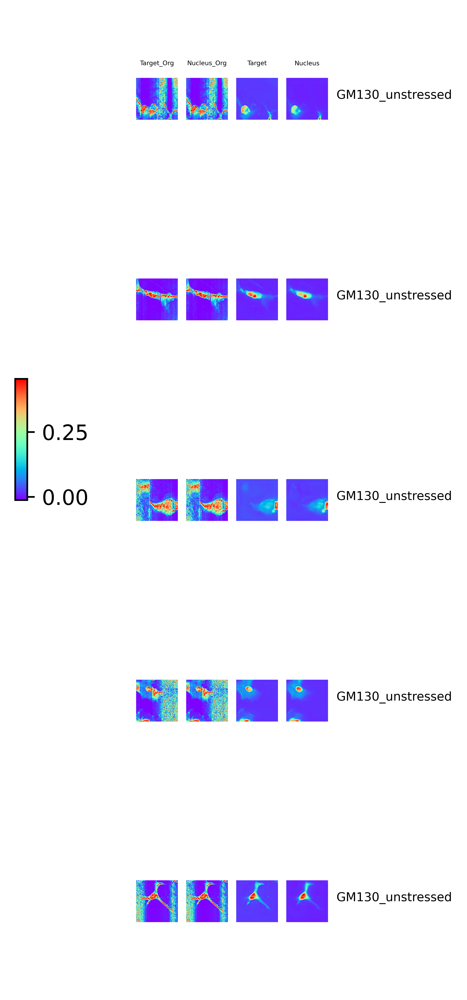

2022-12-26 18:24:36.348119: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:24:36.348242: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:24:36.348255: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:24:36.348268: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:24:36.348281: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:24:36.348292: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-12-26 18:24:36.348304: I tensorflow/stream_executor/plat

X, y:
(5, 100, 100, 2) (5,)
SQSTM1_unstressed    5
dtype: int64
Creating the model


All files will be saved at model_outputs/


Loading weights


2022-12-26 18:25:05 INFO [SQSTM1] Generate reconstructed images (imgself)


./models/microglia_model.h5
is loaded.
Ground truth:
['SQSTM1_unstressed']
Inferring embedding vectors...
5/5 [==============================] - 4s 816ms/sample
(5, 25, 25, 64) (5, 12, 12, 64)


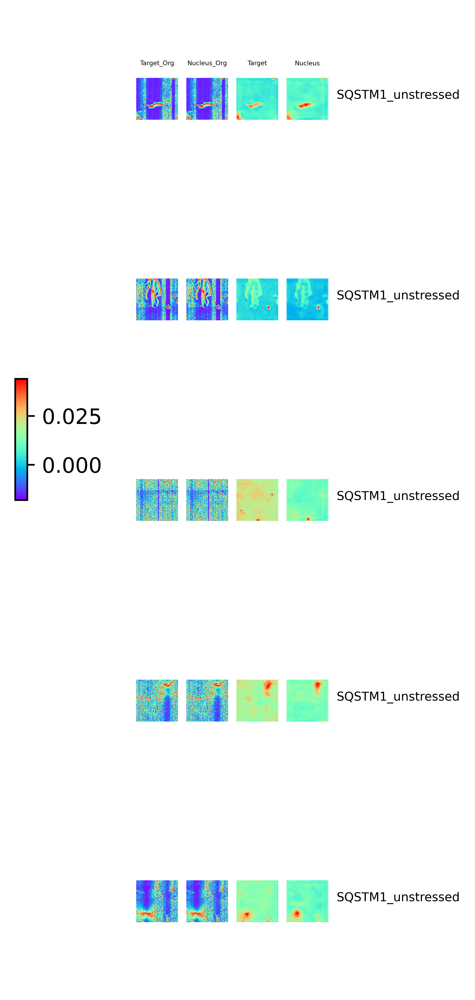

2022-12-26 18:25:15.683118: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Quadro RTX 6000 major: 7 minor: 5 memoryClockRate(GHz): 1.77
pciBusID: 0000:b2:00.0
2022-12-26 18:25:15.683215: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2022-12-26 18:25:15.683228: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2022-12-26 18:25:15.683239: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcufft.so.10.0
2022-12-26 18:25:15.683248: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcurand.so.10.0
2022-12-26 18:25:15.683258: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcusolver.so.10.0
2022-12-26 18:25:15.683267: I tensorflow/stream_executor/plat

In [6]:
n_images = 5
logging.info(f"init")

labels_s = pd.Series(labels.reshape(-1,))

for m in ["KIF5A","FUS","SCNA","PSD95","GM130","SQSTM1"]:
    logging.info(f"[{m}] Marker: {m}")
    markers_regex = '|'.join(list(map(lambda x: f"^{x}$|^{x}_", [m])))
    markers_indexes = labels_s[labels_s.str.contains(markers_regex)].index
    markers_indexes_subset = np.random.choice(markers_indexes,
                                              size=min(n_images, len(markers_indexes)),
                                              replace=False)
    images_subset = images[markers_indexes_subset]
    labels_subset = labels[markers_indexes_subset]  

    # Load models
#     logging.info(f"[{m}] get analytics_cytoself")
#     analytics_cytoself = get_analytics(images_subset, labels_subset, model_path=cytoself_model_path)
    logging.info(f"[{m}] get analytics_neuroself")
    analytics_imgself = get_analytics(images_subset, labels_subset, model_path=imgself_model_path)

    # Generate reconsturcted images and calculate reconstruction error (MSE)
#     logging.info(f"[{m}] Generate reconstructed images (cytoself)")
#     calc_reconstruction_error(analytics_cytoself, show=True,to_norm=False)

    logging.info(f"[{m}] Generate reconstructed images (imgself)")
    calc_reconstruction_error(analytics_imgself, show=True,to_norm=False)